In [189]:
# imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# pandas display options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

random_state = 42
np.random.seed(random_state)

base_path = 'data'
file_name = 'season.csv'
type_dict ={
    'LapStartTime': np.float32,
    'LapNumber': np.uint8,
    'LapTime': np.float32,
    'DriverNumber': "category",
    'Team' : "category",
    'Compound': "category",
    'TyreLife': np.uint8,
    'TrackStatus': "category",
    'Stint': np.uint8,
    'DistanceToDriverAhead': np.float32,
    'DriverAhead': "category",
    'PitStatus': "category",
    'IsAccurate': np.bool_,
    'Track': "category",
    'NumberOfPitStops': np.uint8,
    'Position' : np.uint8,
    'GapToLeader' : np.float32,
    'IntervalToPositionAhead' : np.float32,
    'LapsToLeader' : np.uint8,
    'TotalLaps' : np.uint8,
    'AirTemp': np.float32,
    'Humidity': np.float32,
    'Pressure': np.float32,
    'TrackTemp': np.float32,
    'WindDirection': np.float32,
    'WindSpeed': np.float32
    }

years = range(2019, 2023)

In [190]:
data = pd.DataFrame()

for year in years:
    path = os.path.join(base_path, str(year), file_name)
    year_csv = pd.read_csv(
            path,
            dtype=type_dict,
    )
    data = pd.concat([
        data,
        year_csv
    ])

# Preprocessing

In [191]:
## Rainfall -------------------------------------------------------------------

def process_rainfall(df): # Removes races with rain
    rain = df.groupby(['Year', 'RoundNumber', 'DriverNumber'])['Compound'].transform(lambda x: x[x.str.contains('INTERMEDIATE|WET')].count())
    return df[rain == 0].reset_index(drop=True)

## Incomplete races -----------------------------------------------------------
def incomplete_races(df):
    return df.groupby(['Year', 'RoundNumber', 'DriverNumber']).filter(lambda x: x['LapNumber'].max() + 3 >= x['TotalLaps'].max()).reset_index(drop=True)

## Pitstops -------------------------------------------------------------------
def process_pitstops(df):
    df['PitStatus'] = df.groupby(['Year', 'RoundNumber', 'DriverNumber'])['PitStatus'].shift(-1, fill_value='NoPit')
    return df
## TrackName ------------------------------------------------------------------

def process_track_name(df):
    df['Track'] = df['Track'].str.replace(' ', '_')
    return df
## TrackStatus ----------------------------------------------------------------

def trackStatus_to_binary(df):
    trackStatus = df['TrackStatus']
    status = pd.Series(
        np.zeros(6, dtype=np.bool8),
        index=['Green', 'Yellow', 'SC', 'Red', 'VSC', 'SC_ending']
    )
    if "1" in trackStatus:
        status['Green'] = True
    if "2" in trackStatus:
        status['Yellow'] = True
    if "4" in trackStatus:
        status['SC'] = True
    if "5" in trackStatus:
        status['Red'] = True
    if "6" in trackStatus:
        status['VSC'] = True
    if "7" in trackStatus:
        status['SC_ending'] = True
    return status

def process_trackStatus(df):
    trackStatuses = df.apply(trackStatus_to_binary, axis=1)
    return pd.concat([df.drop('TrackStatus', axis=1), trackStatuses], axis=1)

## Missing Data ----------------------------------------------------------------

def process_missing_values(df):
    # TODO fill the missing values better
    df.fillna({
        'DistanceToDriverAhead': -1,
        'GapToLeader': -1,
        'IntervalToPositionAhead': -1,
    }, inplace=True)

    # drop all rows with missing laptime
    df.dropna(subset=['LapTime'], inplace=True)
    return df[df['LapNumber'] > 1].reset_index(drop=True)

## Datatypes -------------------------------------------------------------------

def process_datatypes(df):
    # boolean
    df['Green'] = df['Green'].astype('bool')
    df['Yellow'] = df['Yellow'].astype('bool')
    df['SC'] = df['SC'].astype('bool')
    df['Red'] = df['Red'].astype('bool')
    df['VSC'] = df['VSC'].astype('bool')
    df['SC_ending'] = df['SC_ending'].astype('bool')
    df['IsAccurate'] = df['IsAccurate'].astype('bool')
    df['Rainfall'] = df['Rainfall'].astype('bool')
    # category
    df['DriverNumber'] = df['DriverNumber'].astype('category')
    df['Team'] = df['Team'].astype('category')
    #df['Compound'] = df['Compound'].astype('category')
    df['DriverAhead'] = df['DriverAhead'].astype('category')
    #df['Track'] = df['Track'].astype('category')
    # float
    df['LapStartTime'] = df['LapStartTime'].astype('float32')
    df['LapTime'] = df['LapTime'].astype('float32')
    df['DistanceToDriverAhead'] = df['DistanceToDriverAhead'].astype('float32')
    df['GapToLeader'] = df['GapToLeader'].astype('float32')
    df['IntervalToPositionAhead'] = df['IntervalToPositionAhead'].astype('float32')
    df['AirTemp'] = df['AirTemp'].astype('float32')
    df['Humidity'] = df['Humidity'].astype('float32')
    df['Pressure'] = df['Pressure'].astype('float32')
    df['TrackTemp'] = df['TrackTemp'].astype('float32')
    df['WindDirection'] = df['WindDirection'].astype('float32')
    df['WindSpeed'] = df['WindSpeed'].astype('float32')
    # int
    df['LapNumber'] = df['LapNumber'].astype('uint8')
    df['TyreLife'] = df['TyreLife'].astype('uint8')
    df['Stint'] = df['Stint'].astype('uint8')
    df['NumberOfPitStops'] = df['NumberOfPitStops'].astype('uint8')
    df['Position'] = df['Position'].astype('uint8')
    df['LapsToLeader'] = df['LapsToLeader'].astype('uint8')
    df['TotalLaps'] = df['TotalLaps'].astype('uint8')
    return df

## Add target ------------------------------------------------------------------

def process_target(df):
    df['is_pitting'] = df['PitStatus'] == 'InLap'
    df['is_pitting'] = df['is_pitting'].astype('bool')
    return df

## Remove features -------------------------------------------------------------

def process_remove_features(df):
    df.drop(['LapStartTime', 'DriverNumber', 'Team', 'DriverAhead', 
    'AirTemp', 'Humidity', 'Pressure', 'Rainfall', 'TrackTemp', 'WindDirection', 'WindSpeed',
    'PitStatus', 'IsAccurate', 'Year', 'RoundNumber'], axis=1, inplace=True)
    return df

## Feature encoding ------------------------------------------------------------

from sklearn.preprocessing import OneHotEncoder

def process_feature_encoding(df):
    categorical_features = ['Compound', 'Track']
    one_hot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
    one_hot_encoder.fit(df[categorical_features])
    one_hot_encoded = one_hot_encoder.transform(df[categorical_features])
    one_hot_encoded = pd.DataFrame(one_hot_encoded, columns=one_hot_encoder.get_feature_names_out(categorical_features))
    print("One hot : ", one_hot_encoded.shape)
    print("Data : ", df.shape)
    df = df.join(one_hot_encoded)
    df.drop(categorical_features, axis=1, inplace=True)
    return df, one_hot_encoder

def process_feature_encoding_new(df, encoder):
    categorical_features = ['Compound', 'Track']
    one_hot_encoded = encoder.transform(df[categorical_features])
    one_hot_encoded = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_features))
    df = df.join(one_hot_encoded)
    df.drop(categorical_features, axis=1, inplace=True)
    return df

In [192]:
def preprocess_pre_split(df):
    df = df.copy()
    print('Preprocessing data...', df.shape)
    df = process_rainfall(df)
    print('Rainfall processed...', df.shape)
    df = incomplete_races(df)
    df = process_pitstops(df)
    df = process_track_name(df)
    print('TrackName processed...', df.shape)
    df = process_missing_values(df)
    print('Missing values processed...', df.shape)
    return df

def preprocess_post_split(df):
    df = process_trackStatus(df)
    print('TrackStatus processed...', df.shape)
    df = process_datatypes(df)
    print('Preprocessing data...', df.shape)
    df = process_remove_features(df)
    print('Features removed...', df.shape)
    return df

def preprocess_post_split_train(df):
    df = df.copy()
    df = process_target(df)
    print('Target processed...', df.shape)
    df, encoder = process_feature_encoding(df)
    print('Features encoded...', df.shape)

    df = preprocess_post_split(df)
    
    return df, encoder

def preprocess_post_split_test(df, encoder):
    df = df.copy()
    df = process_target(df)
    print('Target processed...', df.shape)
    df = process_feature_encoding_new(df, encoder)
    print('Features encoded...', df.shape)

    df = preprocess_post_split(df)

    return df

In [193]:
def get_races_grouped(df):
    return df.groupby(['Year', 'RoundNumber', 'DriverNumber'])

def get_train_test_split(df, test_size, return_groups=False):
    groups = get_races_grouped(df).groups
    groups_keys = list(groups.keys())
    np.random.seed(random_state)
    np.random.shuffle(groups_keys)
    test_groups = groups_keys[:int(len(groups_keys) * test_size)]
    train_groups = groups_keys[int(len(groups_keys) * test_size):]
    test = df[df.apply(lambda x: (x['Year'], x['RoundNumber'], x['DriverNumber']) in test_groups, axis=1)].reset_index(drop=True)
    train = df[df.apply(lambda x: (x['Year'], x['RoundNumber'], x['DriverNumber']) in train_groups, axis=1)].reset_index(drop=True)
    if return_groups:
        return train, test, train.groupby(['Year', 'RoundNumber', 'DriverNumber']).groups, test.groupby(['Year', 'RoundNumber', 'DriverNumber']).groups
    return train, test

In [194]:
df = data.copy()
df = preprocess_pre_split(df)

train_df, test_df, train_groups, test_groups = get_train_test_split(df.copy(), test_size=0.2, return_groups=True)

train_df, encoder = preprocess_post_split_train(train_df)
test_df = preprocess_post_split_test(test_df, encoder)

train_df.dropna(inplace=True)
test_df.dropna(inplace=True)

X_train = train_df.drop(['is_pitting'], axis=1)
y_train = train_df['is_pitting']

X_test = test_df.drop(['is_pitting'], axis=1)
y_test = test_df['is_pitting']

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Preprocessing data... (89139, 29)
Rainfall processed... (78346, 29)
TrackName processed... (73105, 29)
Missing values processed... (70689, 29)
Target processed... (56570, 30)
One hot :  (56570, 32)
Data :  (56570, 30)
Features encoded... (56570, 60)


C:\Users\Nelson Jeanrenaud\AppData\Local\Temp\ipykernel_21676\4238731514.py:25: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  np.zeros(6, dtype=np.bool8),


TrackStatus processed... (56570, 65)
Preprocessing data... (56570, 65)
Features removed... (56570, 50)
Target processed... (14119, 30)
Features encoded... (14119, 60)


C:\Users\Nelson Jeanrenaud\AppData\Local\Temp\ipykernel_21676\4238731514.py:25: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  np.zeros(6, dtype=np.bool8),


TrackStatus processed... (14119, 65)
Preprocessing data... (14119, 65)
Features removed... (14119, 50)
(56570, 49) (14119, 49) (56570,) (14119,)


# Modelisation

In [195]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
def specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    return tn / (tn + fp)

def balanced_accuracy(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    return (specificity + sensitivity) / 2

In [196]:
model = RandomForestClassifier(
    n_estimators=100,
    max_depth=20, 
    max_features=None,
    criterion='entropy',
    class_weight='balanced',
    random_state=random_state,
    n_jobs=-1
)

model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, max_features=None, n_jobs=-1,
                       random_state=42)

In [197]:
y_pred = model.predict(X_test)

print("Balanced accuracy : ", balanced_accuracy(y_test, y_pred))
print("Specificity : ", specificity(y_test, y_pred))

Balanced accuracy :  0.60926257160448
Specificity :  0.9792304328815041


In [198]:
from sklearn.metrics import classification_report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[13437   285]
 [  302    95]]
              precision    recall  f1-score   support

       False       0.98      0.98      0.98     13722
        True       0.25      0.24      0.24       397

    accuracy                           0.96     14119
   macro avg       0.61      0.61      0.61     14119
weighted avg       0.96      0.96      0.96     14119



In [199]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['No Pit', 'Pit'],
    mode='classification',
    discretize_continuous=True,
    random_state=random_state
)

In [200]:
def get_preds(model, X, proba=False):
    def extract(ys):
        if len(ys.shape) == 1:
            return ys
        return [y[1] if len(y) > 1 else y[0] for y in ys]
    if proba:
        try:
            preds = model.predict_proba(np.array(X).astype('float32'))
            return extract(preds)
        except: # for tensorflow models
            preds = model.predict(np.array(X).astype('float32'))
            return extract(preds)
    else:
        preds = model.predict(np.array(X).astype('float32'))
        return extract(preds.round())

def get_predictions_for_race(model, x, y):
    return pd.Series({
                'x': x,
                'y': y,
                'preds': get_preds(model, x, proba=False),
                'proba': get_preds(model, x, proba=True),
            })

In [201]:
def plot_remove_duplicate_legends(ax, **kwargs):
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), **kwargs)
    return ax


def plot_race_predictions(label, track, driver, x, y, proba, ax, color='cyan', marker='X'):
    ax.grid(True)
    ax.hlines(y=0.5, xmin=0, xmax=x['TotalLaps'].max(), linewidth=1, colors='black', linestyles='dotted', zorder=0)
    indexes = np.where(y == 1)
    for idx in indexes:
        ax.vlines(x=idx+2, ymin=0, ymax=1, linewidth=1, colors='red', linestyles='dashed', zorder=0)
    sns.scatterplot(x=x['LapNumber'], y=proba, marker=marker, legend=False, ax=ax, s=50, label=label)
    sns.lineplot(x=x['LapNumber'], y=proba, linewidth=1, linestyle='dashed', zorder=0, ax=ax)
    ax.set_xlabel('Lap Number')
    ax.set_xticks(np.arange(0, x['TotalLaps'].max(), 5))
    ax.set_ylim(0, 1)
    ax.set_ylabel('Probability of pitting')
    ax.set_xlim(0, x['TotalLaps'].max())    

    ax.set_title(f'{track} - Driver {driver}')
    return plot_remove_duplicate_legends(ax, loc='upper left', bbox_to_anchor=(1.01, 1), borderaxespad=0.)

def plot_stoppages(laps, ax):
    ax.grid(True)
    for idx, lap in laps.iterrows():
        if lap['Red']:
            ax.axvspan(idx, idx+1, facecolor='red', alpha=0.3, zorder=0, label='Red Flag')
        elif lap['SC']:
            ax.axvspan(idx, idx+1, facecolor='yellow', alpha=0.3, zorder=0, label='Safety Car', hatch='\\', edgecolor='black')
        elif lap['VSC']:
            ax.axvspan(idx, idx+1, facecolor='yellow', alpha=0.3, zorder=0, label='Virtual Safety Car', hatch='-', edgecolor='black')
        elif lap['SC_ending']:
            ax.axvspan(idx, idx+1, facecolor='yellow', alpha=0.3, zorder=0, label='Safety Car Ending', hatch='\\', edgecolor='green')
        elif lap['Yellow']:
            ax.axvspan(idx, idx+1, facecolor='yellow', alpha=0.3, zorder=0, label='Yellow Flag')

    return plot_remove_duplicate_legends(ax, loc='upper left', bbox_to_anchor=(1.01, 1), borderaxespad=0.)

def plot_tyres(laps, ax):
    ax.grid(True)
    for idx, lap in laps.iterrows():
        if lap['Compound_HARD']:
            ax.axvspan(idx, idx+1, facecolor='red', alpha=1, zorder=-1, label='Soft', ymin=0.99)
            #ax.axhline(y=0.99, xmin=idx, xmax=idx+1, linewidth=1, color='red', zorder=0)
        elif lap['Compound_MEDIUM']:
            ax.axvspan(idx, idx+1, facecolor='yellow', alpha=1, zorder=-1, label='Medium', ymin=0.99)
            #ax.axhline(y=0.99, xmin=idx, xmax=idx+1, linewidth=1, color='yellow', zorder=0)
        elif lap['Compound_SOFT']:
            ax.axvspan(idx, idx+1, facecolor='grey', alpha=1, zorder=-1, label='Hard', ymin=0.99)
            #ax.axhline(y=0.99, xmin=idx, xmax=idx+1, linewidth=1, color='grey', zorder=0)
        elif lap['Compound_INTERMEDIATE']:
            ax.axvspan(idx, idx+1, facecolor='green', alpha=1, zorder=-1, label='Intermediate', ymin=0.9)
            #ax.axhline(y=0.99, xmin=idx, xmax=idx+1, linewidth=1, color='green', zorder=0)
        elif lap['Compound_WET']:
            ax.axvspan(idx, idx+1, facecolor='blue', alpha=1, zorder=-1, label='Wet', ymin=0.99)
            #ax.axhline(y=0.99, xmin=idx, xmax=idx+1, linewidth=1, color='blue', zorder=0)

    return plot_remove_duplicate_legends(ax, loc='upper left', bbox_to_anchor=(1.01, 1), borderaxespad=0.)

In [202]:
def explain_race(race_id):
    race = list(test_groups.keys())[race_id]

    driver_number = race[2]
    track = race[1]
    year = race[0]

    test_race_x = X_test.iloc[test_groups.get(race)]
    test_race_y = y_test.iloc[test_groups.get(race)]

    preds = get_predictions_for_race(model, test_race_x, test_race_y)

    fig, ax = plt.subplots(figsize=(15, 5))
    plot_race_predictions('RF', track, driver_number, test_race_x, test_race_y, preds['proba'], ax)
    plot_stoppages(test_race_x, ax)
    plot_tyres(test_race_x, ax)
    plt.savefig(f'test_target/sep_shift_preds_{race_id}.png', bbox_inches='tight')

    pit_id = np.where(preds['y'] == 1)[0][0]
    print(pit_id)
    exp = explainer.explain_instance(
    test_race_x.iloc[pit_id],
    model.predict_proba,
    num_features=10,
    top_labels=1
    )

    exp.show_in_notebook(show_table=True)
    exp.save_to_file(f'test_target/sep_shift_explanation_{race_id}.html')

c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


12


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


9


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


8


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


33


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


19


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


4


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


31


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


9


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


11


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


10


c:\Users\Nelson Jeanrenaud\miniconda3\envs\bsc\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


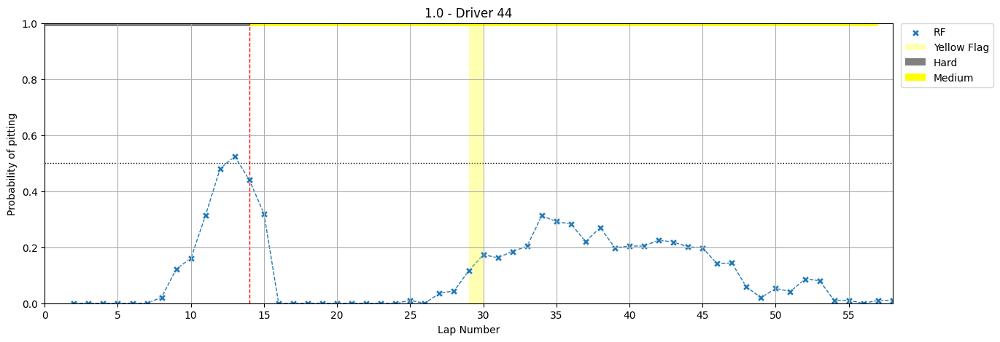

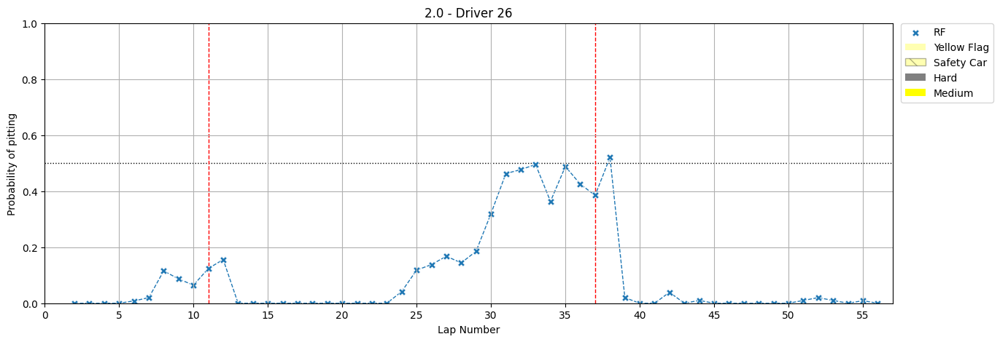

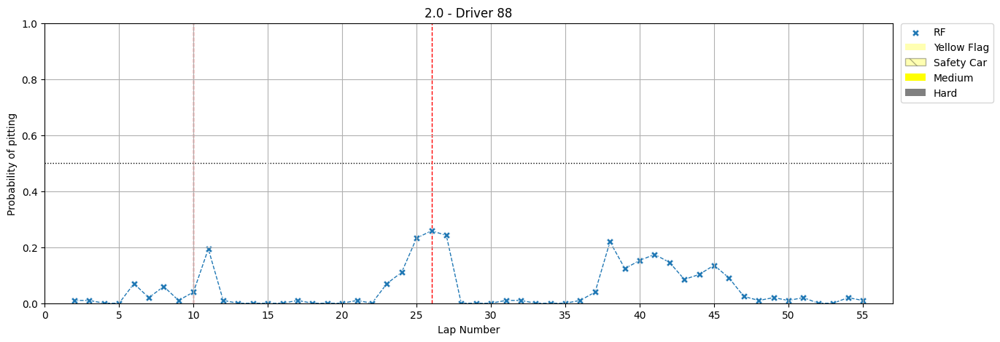

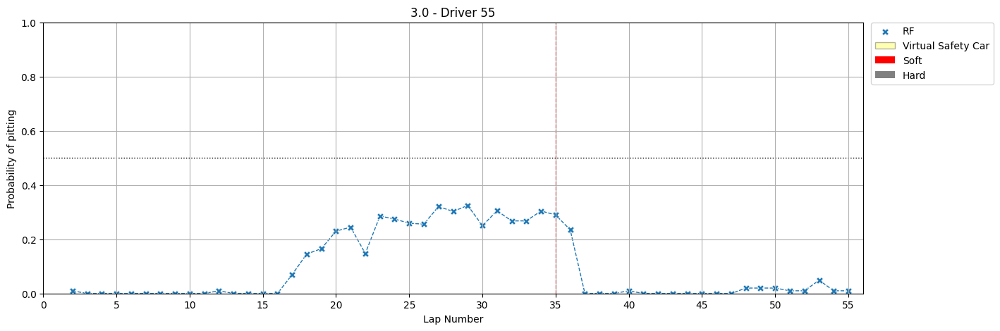

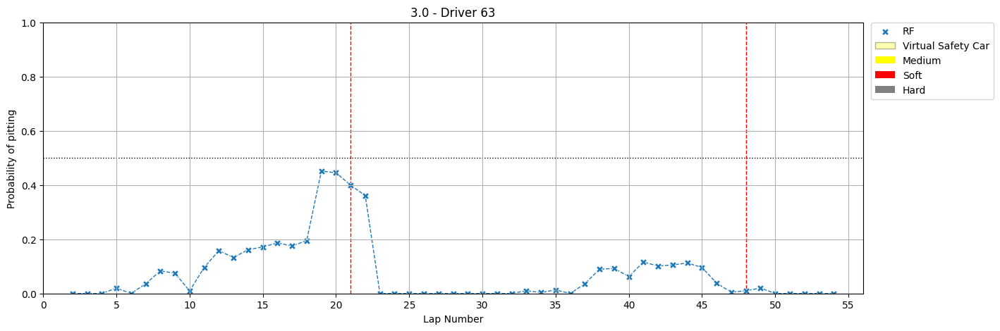

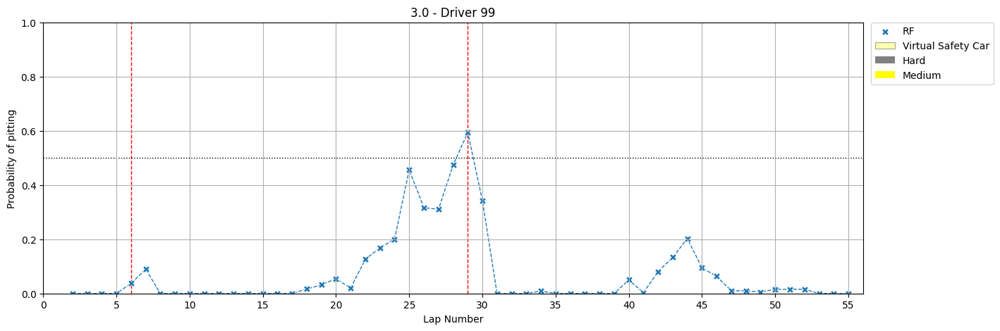

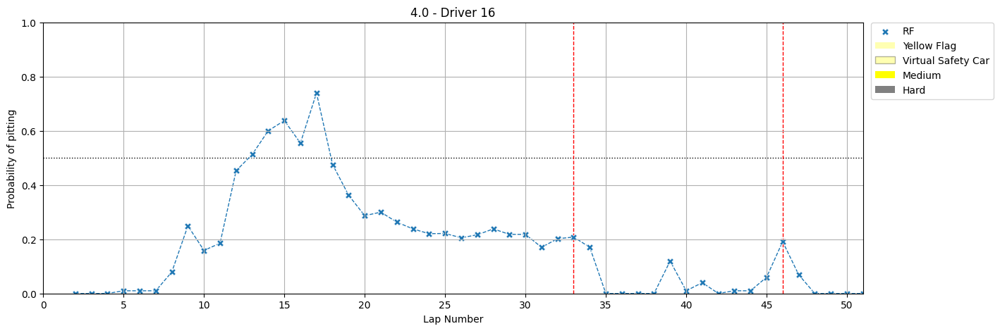

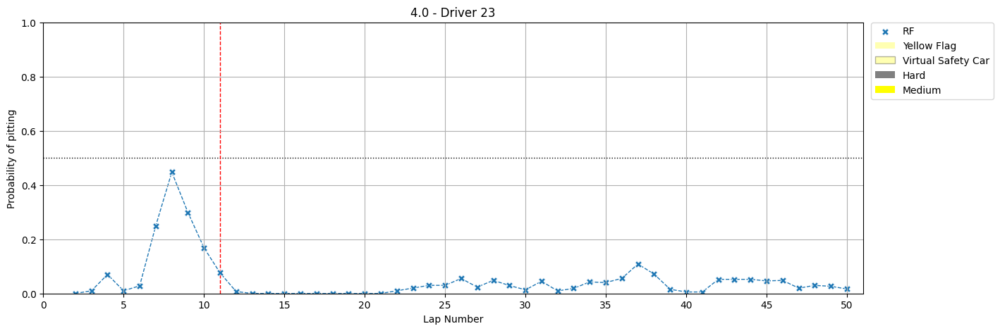

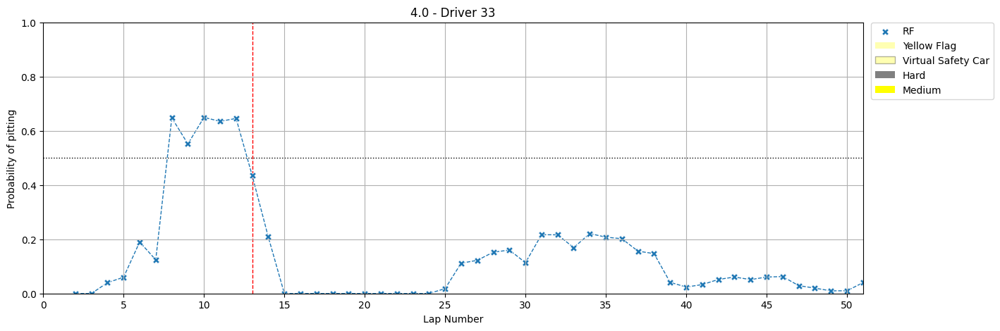

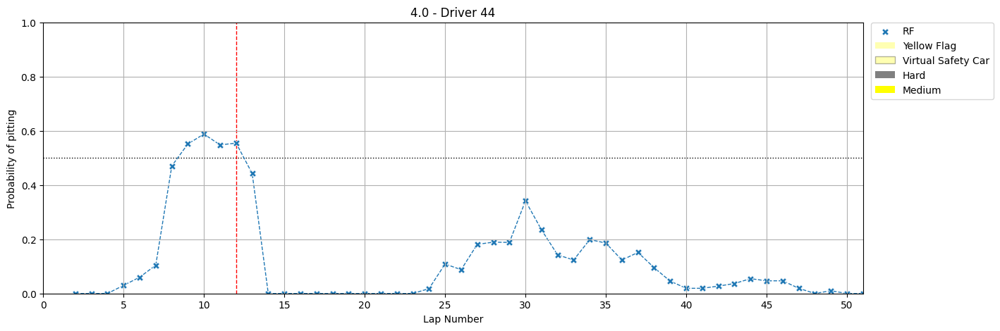

In [203]:
for i in range(0, 10):
    explain_race(i)